Установка окружения и импорт библиотек:

In [1]:
!pip install mesh_to_sdf pyrender trimesh
!pip install torch torchvision
!pip install git+https://github.com/facebookresearch/pytorch3d.git@v0.2.0

     |████████████████████████████████| 1.2 MB 6.2 MB/s 
     |████████████████████████████████| 639 kB 40.5 MB/s 
     |████████████████████████████████| 890 kB 38.3 MB/s 
     |████████████████████████████████| 2.2 MB 24.3 MB/s 
  Created wheel for pyopengl: filename=PyOpenGL-3.1.0-py3-none-any.whl size=1745210 sha256=1869e3b37fac6ca0b9dd921ff9afdec2ac59b9ea008bc770baedb1b0b16e264b
  Stored in directory: /root/.cache/pip/wheels/c6/83/cb/af51a0c06c33d08537b941bbfc87469e8a3c68d05f77a6a212
Successfully built pyopengl
  Attempting uninstall: pyopengl
    Found existing installation: PyOpenGL 3.1.5
    Uninstalling PyOpenGL-3.1.5:
      Successfully uninstalled PyOpenGL-3.1.5
  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision v0.2.0) to /tmp/pip-req-build-8b9o3mh1
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-8b9o3mh1
  Running command git checkout -q 686c8666d31d932ed42d3cd7319f249fc75e89a9
     |████████████████

In [2]:
import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

import torch

# untilitis 
from pytorch3d.utils import ico_sphere

# loss functions and regulaziers
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency
)

# io utils
from pytorch3d.io import load_obj

# operations with data
from pytorch3d.ops import sample_points_from_meshes

# datastructures
from pytorch3d.structures import Meshes, Textures

# render 
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)

# mesh_to_sdf lib by marian42
from mesh_to_sdf import mesh_to_sdf, sample_sdf_near_surface

# trimesh lib imports
import trimesh
from trimesh.voxel.creation import voxelize

Выбор среды выполнения

In [3]:
# If you have got a CUDA device, you can use GPU mode
if torch.cuda.is_available():
  device = torch.device('cuda:0')
  torch.cuda.set_device(device)
else:
  device = torch.device('cpu')

Создание пути к obj-модели

In [4]:
#!mkdir models

In [5]:
!mkdir data
!wget -nc -P ./data/ https://raw.githubusercontent.com/basarab1504/ml/main/12140_Skull_v3_L2.obj
model_path = os.path.join("data", "12140_Skull_v3_L2.obj")

--2021-12-24 20:43:16--  https://raw.githubusercontent.com/basarab1504/ml/main/12140_Skull_v3_L2.obj
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6007426 (5.7M) [text/plain]
Saving to: ‘./data/12140_Skull_v3_L2.obj’

12140_Skull_v3_L2.o 100%[===================>]   5.73M  --.-KB/s    in 0.08s   

2021-12-24 20:43:16 (71.3 MB/s) - ‘./data/12140_Skull_v3_L2.obj’ saved [6007426/6007426]



### Полигональная модель

In [6]:
# Trimesh
skull_trimesh = trimesh.load(model_path)

if isinstance(skull_trimesh, trimesh.Scene):
    skull_trimesh = skull_trimesh.dump(concatenate=True)

skull_trimesh.vertices -= skull_trimesh.center_mass
scaling = 2 / skull_trimesh.scale
skull_trimesh.apply_scale(scaling=scaling)

verts, faces_idx, _ = load_obj(model_path)
faces = faces_idx.verts_idx

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)

textures = Textures(verts_rgb=verts_rgb.to(device))

# Create a Meshes object for the skull
skull_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

/usr/local/lib/python3.7/dist-packages/pytorch3d/io/obj_io.py:484: UserWarning: Mtl file does not exist: data/12140_Skull_v3_L2.mtl
  warnings.warn(f"Mtl file does not exist: {f_mtl}")


In [7]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a point light in front of the object. 
#lights = PointLights(device=device, location=((2.0, 2.0, -2.0),))
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


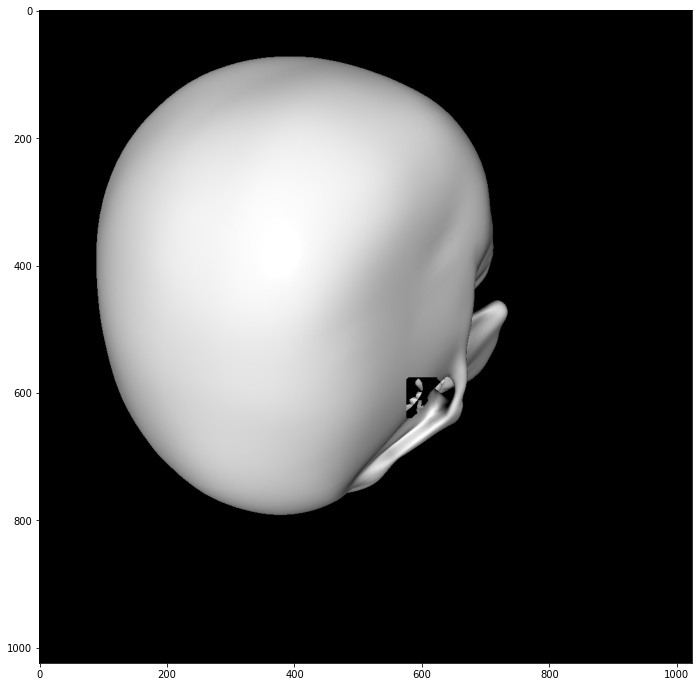

In [8]:
# Select the viewpoint using spherical angles  
distance = 2.0    # distance from camera to the object`
elevation = 40.0  # angle of elevation in degrees
azimuth = 45.0    # rotation

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device = device, at = ((-0.02, 0.1, 0.0),))

# Render the Campfire providing the values of R and T.
skull_image = phong_renderer(meshes_world = skull_mesh, R = R, T = T)

skull_image = skull_image.cpu().numpy()

plt.figure(figsize=(12, 12))
plt.imshow(skull_image.squeeze())
plt.grid(False)

In [9]:
skull_trimesh.show()

Характеристики модели

In [10]:
print("Эйлерова характеристика пространственного графа модели: Xi = V - E + F =", skull_trimesh.euler_number)
print("Is skull mesh watertight:", skull_trimesh.is_watertight)
print("Объем модели Porsche_911_GT2.obj:", skull_trimesh.volume)

Эйлерова характеристика пространственного графа модели: Xi = V - E + F = 89
Is car mesh watertight: False
Объем модели Porsche_911_GT2.obj: 0.6228689499011791


### Воксельные модели

In [11]:
low_idx_skull = skull_trimesh.scale / 50
vox_low_skull = voxelize(skull_trimesh, pitch=low_idx_skull)
print("Размер воксельной сетки с низким разрешением:\n", vox_low_skull.shape)
print("Срез воксельной сетки:\n", np.array(vox_low_skull.matrix, dtype=np.uint8)[1])

Размер воксельной сетки с низким разрешением:
 (23, 34, 32)
Срез воксельной сетки:
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [12]:
vox_low_skull.show()

In [13]:
high_idx_skull = skull_trimesh.scale / 150
vox_high_skull = voxelize(skull_trimesh, pitch = high_idx_skull)
print("Размер воксельной сетки с высоким разрешением:\n", vox_high_skull.shape)
print("Срез воксельной сетки:\n", np.array(vox_high_skull.matrix, dtype=np.uint8)[1])

Размер воксельной сетки с высоким разрешением:
 (67, 99, 93)
Срез воксельной сетки:
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [14]:
vox_high_skull.show()

### Твердотельная/функциональная модель, описанная SDF

In [15]:
center_mass = skull_trimesh.center_mass
query_points = np.array([[center_mass], [[3,3,3]]])
for point in query_points:
    print("SDF{0} = {1}".format(point[0], mesh_to_sdf(skull_trimesh, point)[0]))

SDF[-8.58724892e-18  7.42680988e-18 -8.72650161e-17] = -0.21896837651729584
SDF[3. 3. 3.] = 4.64377498626709


In [16]:
points, sdf = sample_sdf_near_surface(skull_trimesh, number_of_points = 10000)

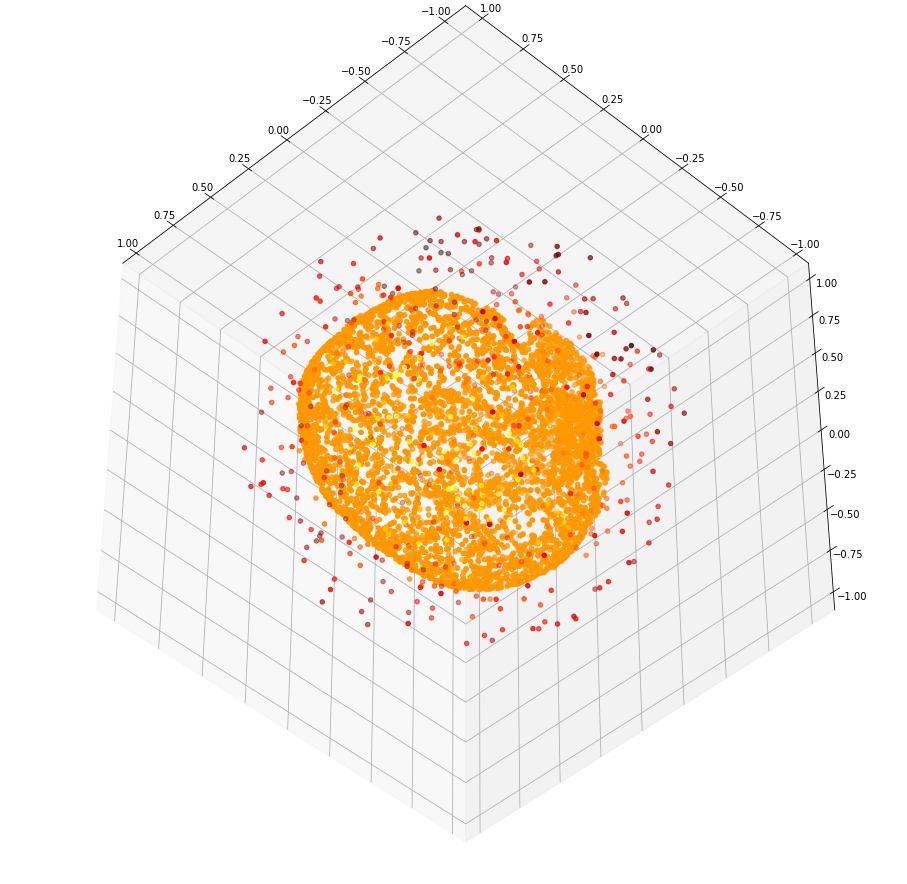

In [17]:
fig = plt.figure(figsize=(16, 16))
ax = fig.add_subplot(111, projection="3d")
ax.view_init(elev=-45, azim=135)
ax.scatter(points[:, 0], points[:, 1], zs=-points[:, 2], c=sdf, cmap="hot_r")

### Построение облака точек

In [18]:
# Mesh to pointcloud with normals in pytorch3d
num_points_to_sample = 40000

skull_vert, skull_norm = sample_points_from_meshes(
    skull_mesh,
    num_points_to_sample ,
    return_normals=True
)

In [19]:
def plot_pointcloud(points, elev=70, azim=-70, title=""):
    # Sample points uniformly from the surface of the mesh.
    fig = plt.figure(figsize=(18, 9))
    ax = Axes3D(fig)
    x, y, z = points
    ax.scatter3D(x, z, -y,marker='.')  
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(elev, azim)
    plt.show()

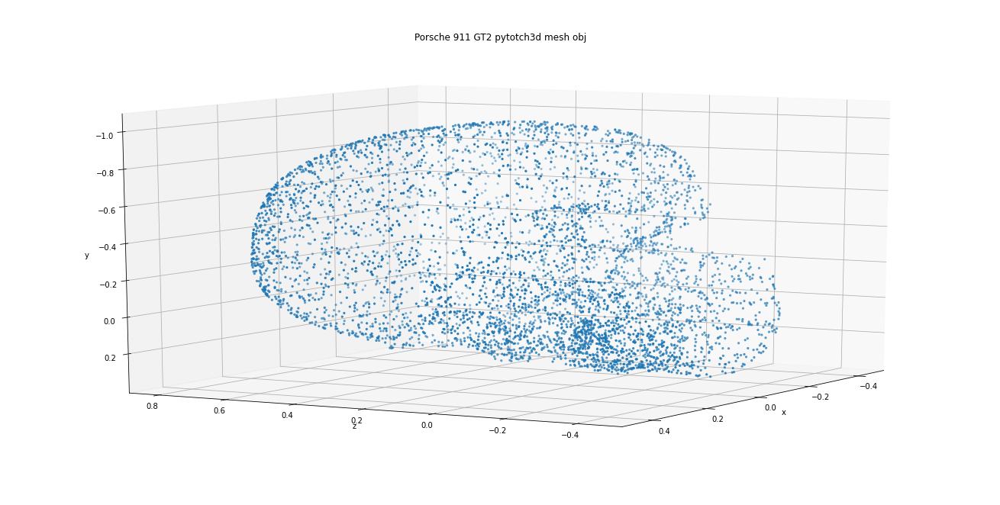

In [20]:
points = sample_points_from_meshes(skull_mesh, 5000)
points = points.clone().detach().cpu().squeeze().unbind(1)
plot_pointcloud(points, elev=190, azim=150, title='Porsche 911 GT2 pytotch3d mesh obj')